In [35]:
from albumentations import (
    HorizontalFlip, IAAPerspective, ShiftScaleRotate, CLAHE, RandomRotate90,
    Transpose, ShiftScaleRotate, Blur, OpticalDistortion, GridDistortion, HueSaturationValue,
    IAAAdditiveGaussianNoise, GaussNoise, MotionBlur, MedianBlur, IAAPiecewiseAffine,
    IAASharpen, IAAEmboss, RandomBrightnessContrast, Flip, OneOf, Compose, ImageOnlyTransform, RandomGamma
)

import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
#import matplotlib as plt
%matplotlib inline
IMG_SIZE = 500
train_set = []
#imagePath = '/home/brett/BigData/trainSet/Impressionism/'
imagePath = '/home/brett/BigData/trainSet/Realism/'

In [36]:
i = 5  #equal to the number of pictures we want to augment and view
for img in os.listdir(imagePath):
	if i > 0:
		img_array = cv2.imread(os.path.join(imagePath, img))
		new_mat = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))

		train_set.append(new_mat)
		i-=1


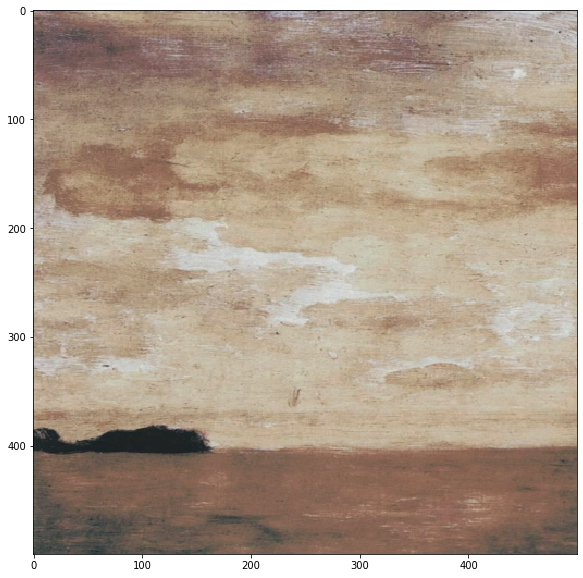

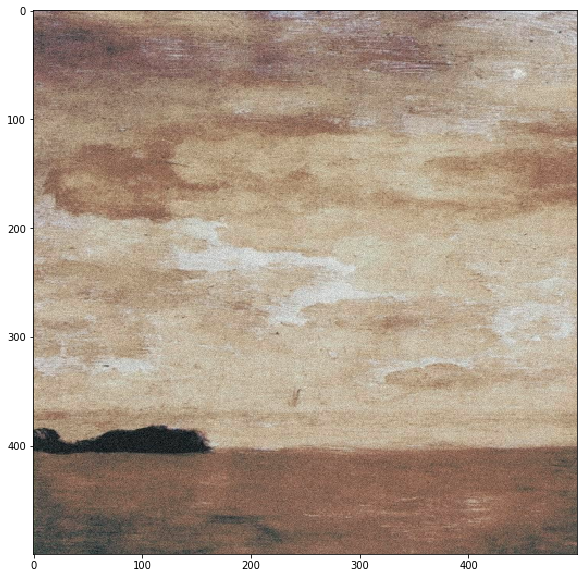

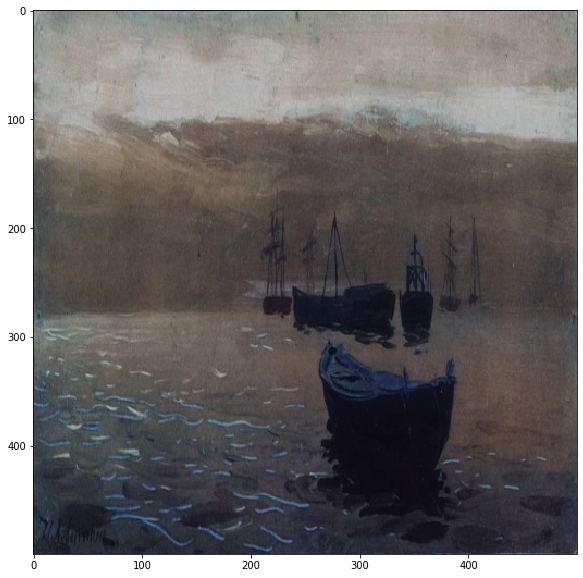

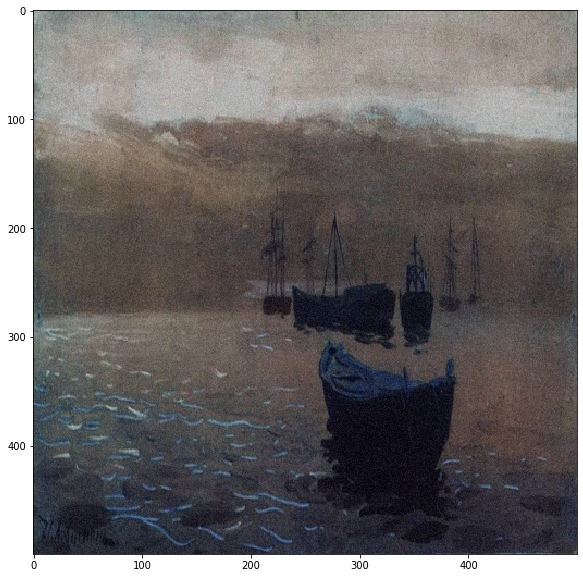

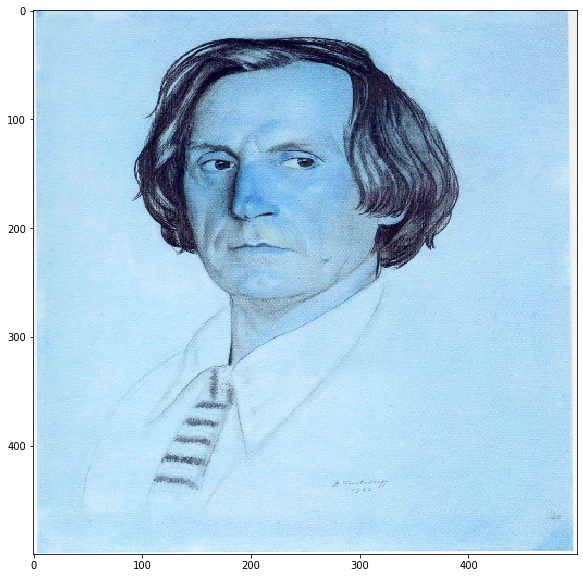

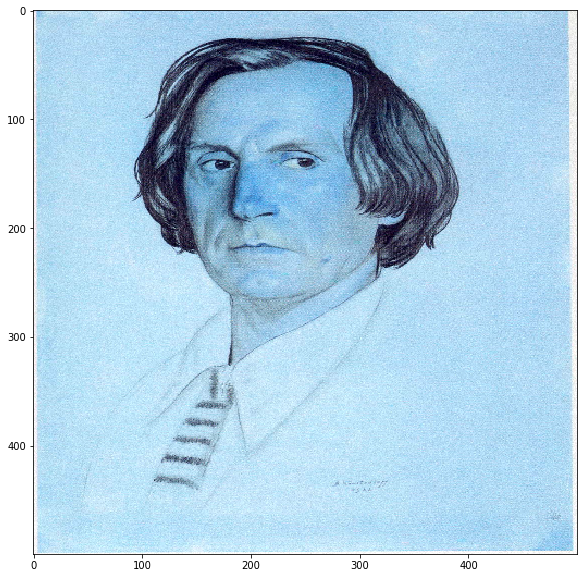

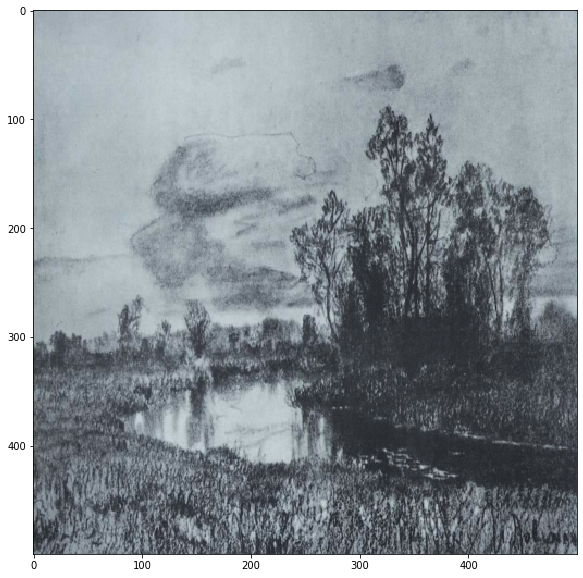

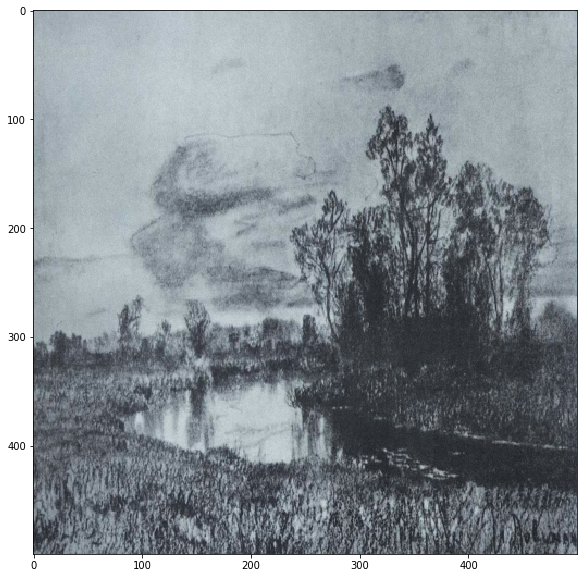

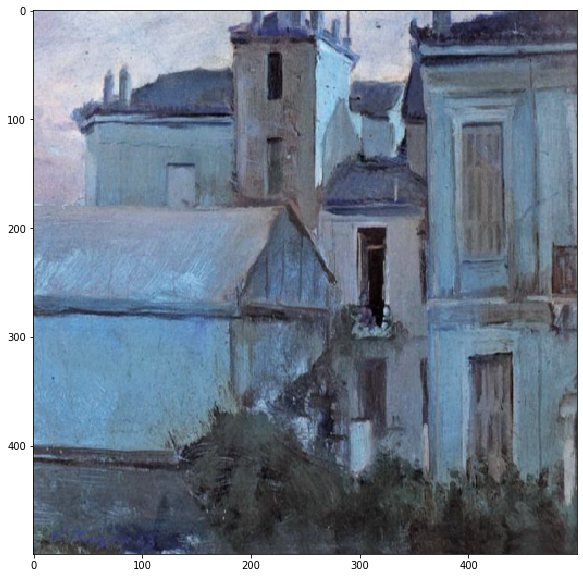

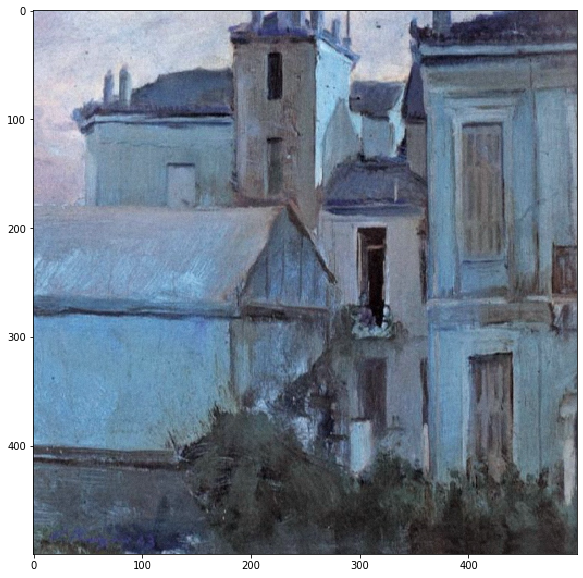

In [39]:
#from documentation
def augment_and_show(aug, image):
    image = aug(image=image)['image']
    plt.figure(figsize=(10, 10))
    plt.imshow(image)

for img in train_set:
    plt.figure(figsize=(10,10))
    plt.imshow(img)
    #augmentation = GaussNoise(p=1)
    augmentation = IAAAdditiveGaussianNoise(always_apply=True)
    #augmentation = Posterize(num_bits=4, always_apply=True, p=1)
    #we can try all of the augmentations, and apply multiple at once
    augment_and_show(augmentation, img)




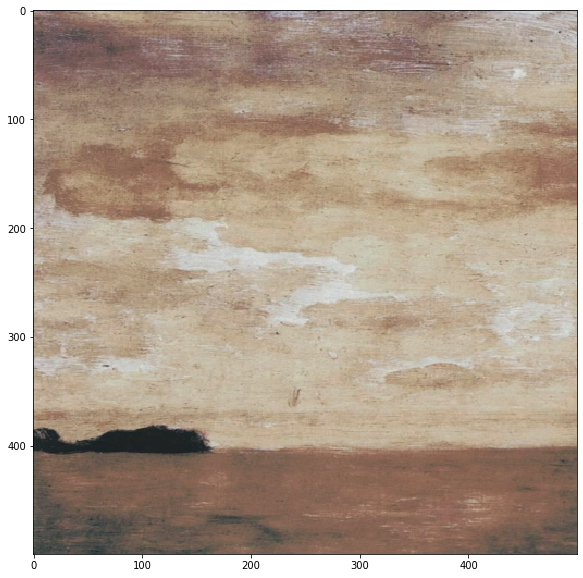

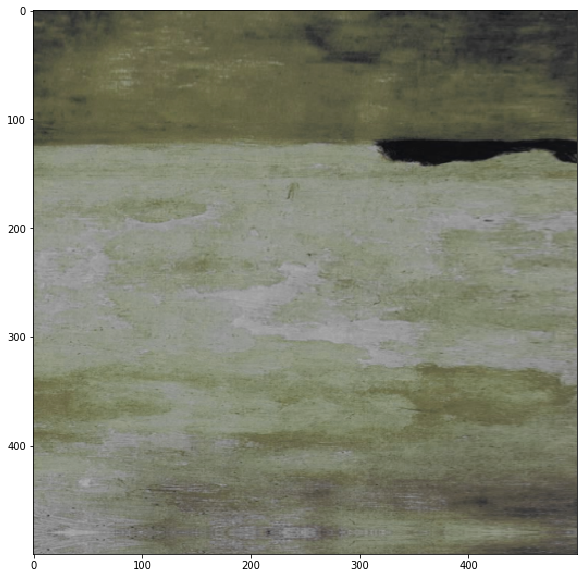

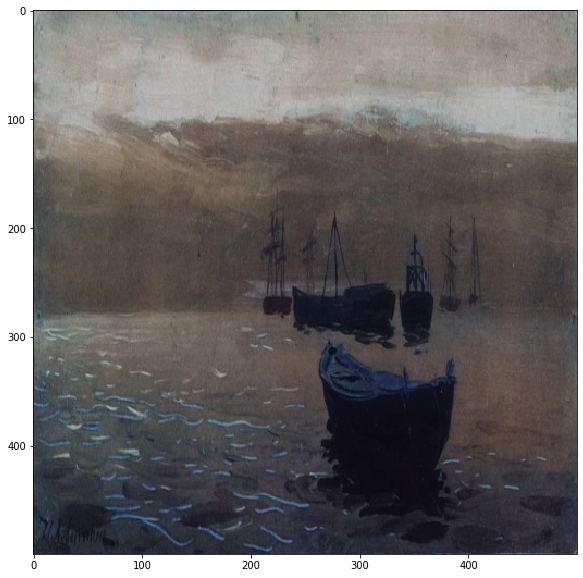

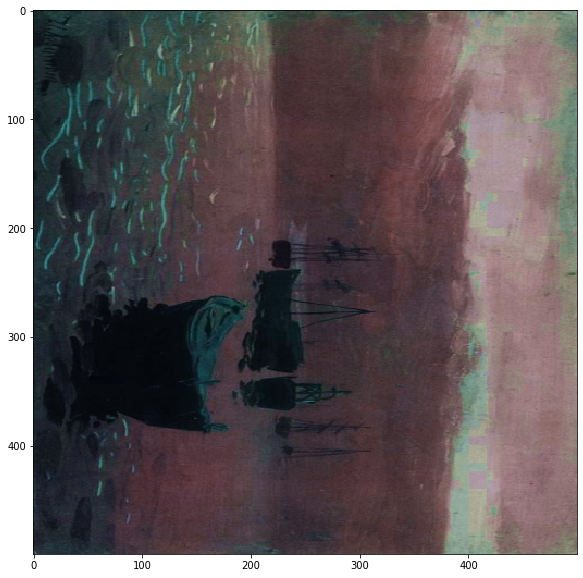

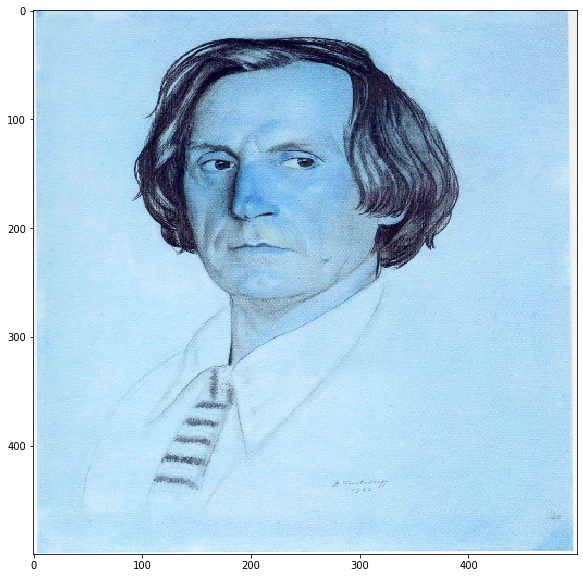

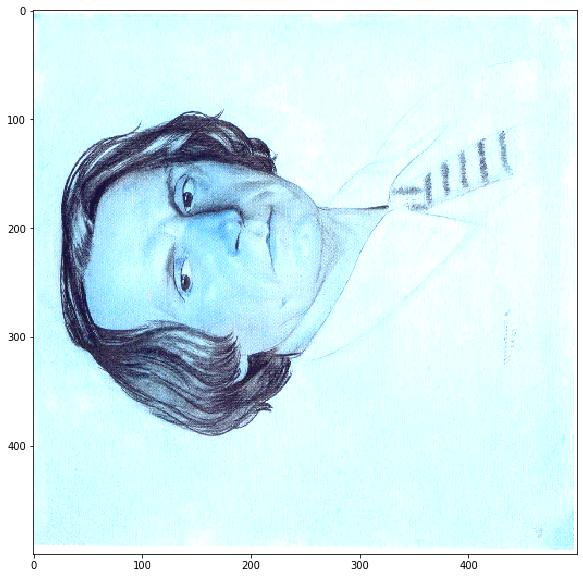

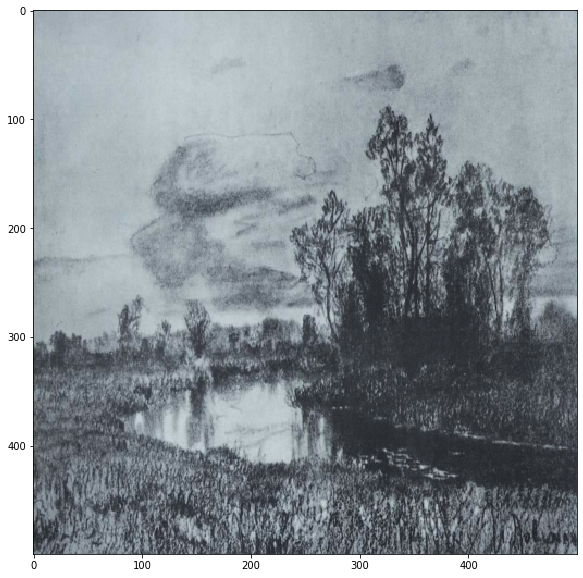

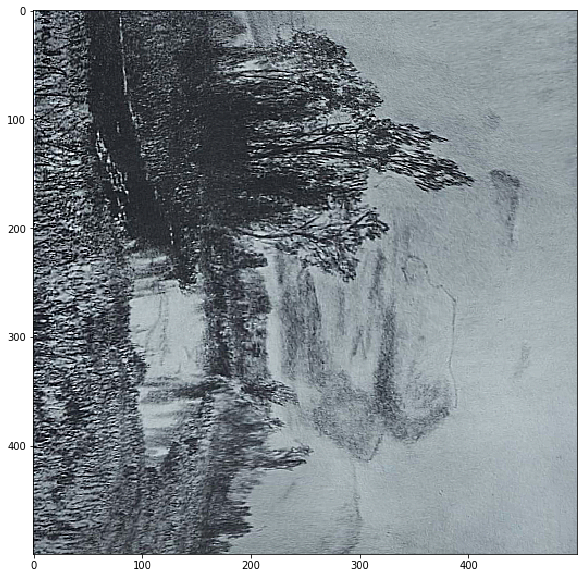

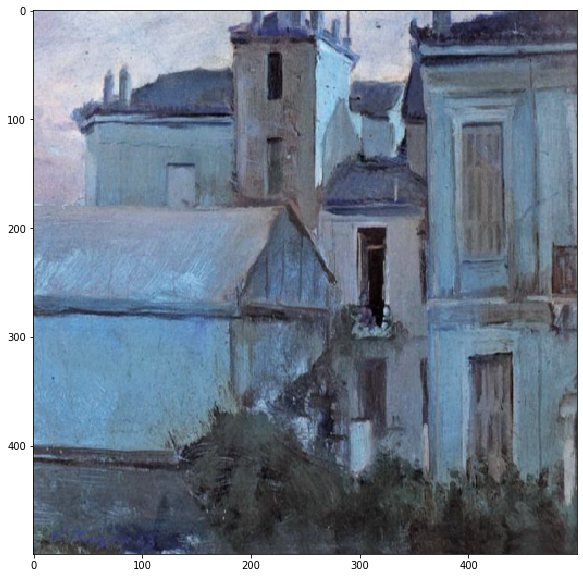

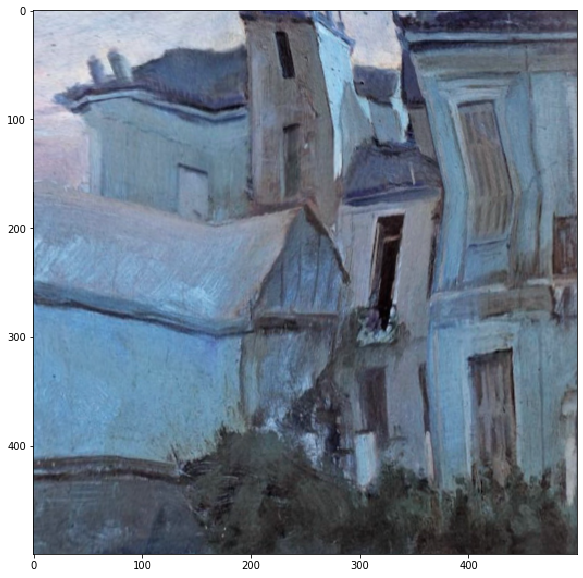

In [34]:
#documentation function



def augment_flips_color(p=.5):
    return Compose([
        CLAHE(),
        RandomRotate90(),
        Transpose(),
        ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.50, rotate_limit=45, p=.75),
        Blur(blur_limit=3),
        OpticalDistortion(),
        GridDistortion(),
        HueSaturationValue()
    ], p=p)

def strong_aug(p=.5):
    return Compose([
        RandomRotate90(),
        Flip(),
        Transpose(),
        OneOf([
            IAAAdditiveGaussianNoise(),
            GaussNoise(),
        ], p=0.2),
        OneOf([
            MotionBlur(p=.2),
            MedianBlur(blur_limit=3, p=0.1),
            Blur(blur_limit=3, p=0.1),
        ], p=0.2),
        ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=45, p=0.2),
        OneOf([
            OpticalDistortion(p=0.3),
            GridDistortion(p=.1),
            IAAPiecewiseAffine(p=0.3),
        ], p=0.2),
        OneOf([
            CLAHE(clip_limit=2),
            IAASharpen(),
            IAAEmboss(),
            RandomBrightnessContrast(),            
        ], p=0.3),
        HueSaturationValue(p=0.3),
    ], p=p)


for img in train_set:
	plt.figure(figsize=(10,10))
	plt.imshow(img)
	augmentation = strong_aug(p=1)
	augment_and_show(augmentation, img)


TypeError: apply() missing 1 required positional argument: 'image'

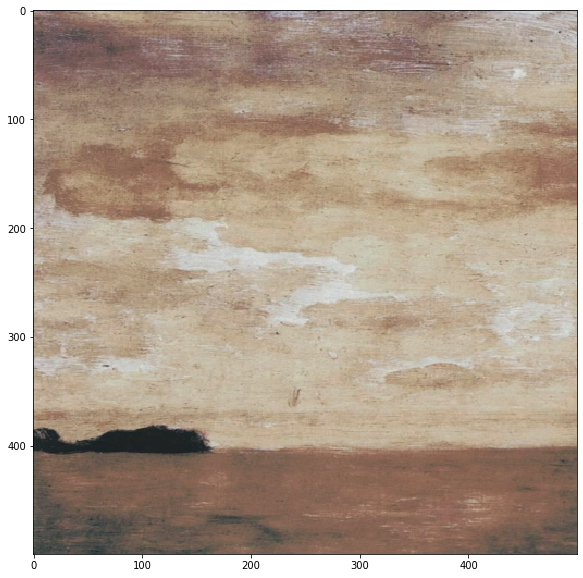

In [19]:
class Posterize(ImageOnlyTransform):
    """Reduce the number of bits for each color channel.

    Args:
        num_bits ((int, int) or int,
                  or list of ints [r, g, b],
                  or list of ints [[r1, r1], [g1, g2], [b1, b2]]): number of high bits.
            If num_bits is a single value, the range will be [num_bits, num_bits].
            Must be in range [0, 8]. Default: 4.
        p (float): probability of applying the transform. Default: 0.5.

    Targets:
    image

    Image types:
        uint8
    """

    def __init__(self, num_bits=4, always_apply=False, p=0.5):
        super(Posterize, self).__init__(always_apply, p)

        if isinstance(num_bits, (list, tuple)):
            if len(num_bits) == 3:
                self.num_bits = [to_tuple(i, 0) for i in num_bits]
            else:
                self.num_bits = to_tuple(num_bits, 0)
        else:
            self.num_bits = to_tuple(num_bits, num_bits)

    def apply(self, image, num_bits=1, **params):
        return F.posterize(image, num_bits)

    def get_params(self):
        if len(self.num_bits) == 3:
            return {"num_bits": [random.randint(i[0], i[1]) for i in self.num_bits]}
        return {"num_bits": random.randint(self.num_bits[0], self.num_bits[1])}

    def get_transform_init_args_names(self):
        return ("num_bits",)
    
for img in train_set:
	plt.figure(figsize=(10,10))
	plt.imshow(img)
	augmentation = Posterize.apply(img, num_bits = 4)
	augment_and_show(augmentation, img)